# Dependencies and utility functions

In [1]:
%%capture
!pip install transformers
!pip install "opencv-contrib-python>=4.5.1"
!wget https://huggingface.co/spaces/vivien/depth-aware-caption/resolve/main/fonts/Display%20-%20Lobster.ttf
!wget https://huggingface.co/spaces/vivien/depth-aware-caption/resolve/main/fonts/Serif%20-%20Cinzel.ttf
!wget -O bowling.mp4 https://drive.google.com/uc?id=17kW2kqT9IDDKioTsJoG_WSILCDs8whzi&export=download
!wget -O weirwood.mp4 https://drive.google.com/uc?id=1zr-wNGTjnDGodRDVXN3bLcnKX8r4WpDy&export=download

In [2]:
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image, ImageDraw, ImageFont

import numpy as np
import torch
from transformers import DPTFeatureExtractor, DPTForDepthEstimation
from statsmodels.nonparametric.kernel_regression import KernelReg

from matplotlib import pyplot as plt, rc

from tqdm.auto import tqdm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-large")
model = DPTForDepthEstimation.from_pretrained("Intel/dpt-large").to(device)

def compute_depth(img):
    image = Image.fromarray(img)
    inputs = feature_extractor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth
    prediction = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=image.size[::-1],
        mode="bicubic",
        align_corners=False,
    )
    return prediction.cpu().numpy()[0, 0, :, :]

def get_text_image(
    shape,
    caption,
    x,
    y,
    font_path,
    font_size=0.1,
    alpha=1.,
    color=(255, 255, 255)
  ):
  img_text = Image.new("RGBA", (shape[1], shape[0]), (0, 0, 0, 0))
  draw = ImageDraw.Draw(img_text)
  draw.text(
      (x, (shape[0] - y)),
      caption,
      fill=(*color, int(max(min(1, alpha), 0) * 255)),
      font=ImageFont.truetype(font_path, round(font_size * shape[1])),
  )
  return np.array(img_text)

def get_mask2(depth_map, relative_depth=0.5, absolute_depth=None, quantile=None):
    if absolute_depth is None:
      absolute_depth = relative_depth * np.min(depth_map) + (1 - relative_depth) * np.max(depth_map)
    elif quantile is not None:
      absolute_depth = np.quantile(depth_map, quantile)
    return np.expand_dims((depth_map[:, :] < absolute_depth), -1)

def add_text(img, text, matrix=None, depth_map=None, depth=0.5, alpha=1.):
  if matrix is not None:
    text = cv2.warpAffine(text, matrix, (text.shape[1], text.shape[0]))
  mask1 = np.dot(np.expand_dims(text[:, :, -1] / 255, -1), np.ones((1, 3)))
  if depth_map is None:
    depth_map = compute_depth(img)
  mask2 = get_mask2(depth_map, relative_depth=depth)
  mask = alpha * mask1 * np.dot(mask2, np.ones((1, 3)))
  return ((1 - mask) * img + mask * text[:, :, :-1]).astype(np.uint8)

def get_keypoints_descriptors(
    img,
    scale_factor=1.02,
    n_features=5000,
    quantile=0.5,
    depth_map=None
  ):
  if depth_map is None:
    depth_map = compute_depth(img)
  mask = ((depth_map < np.quantile(depth_map, quantile))*255).astype(np.uint8)
  descriptor = cv2.xfeatures2d.BEBLID_create(0.75)
  orb = cv2.ORB_create(nfeatures=n_features, scaleFactor=scale_factor)
  kp = orb.detect(img, mask)
  return descriptor.compute(img, kp)

def get_matrix(img, depth_map, des_ref, affine_partial=False, **kwargs):
  kp, des = get_keypoints_descriptors(img, depth_map=depth_map, **kwargs)
  matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
  nn_matches = matcher.knnMatch(des_ref, des, 2)
  matched1 = []
  matched2 = []
  nn_match_ratio = 0.8  # Nearest neighbor matching ratio
  for m, n in nn_matches:
      if m.distance < nn_match_ratio * n.distance:
          matched1.append(kp_ref[m.queryIdx])
          matched2.append(kp[m.trainIdx])
  src_pts = np.float32([m.pt for m in matched1]).reshape(-1, 1, 2)
  dst_pts = np.float32([m.pt for m in matched2]).reshape(-1, 1, 2)
  if src_pts.shape[0] > 20:
    if affine_partial:
      return cv2.estimateAffinePartial2D(src_pts, dst_pts, maxIters=10000)
    else:
      return cv2.estimateAffine2D(src_pts, dst_pts, maxIters=10000)
  else:
    return np.zeros((2, 3)), np.array([0])

def smoothen(sequence):
  n = len(sequence)
  kde = KernelReg(endog=sequence, exog=range(n), var_type='c')
  estimator = kde.fit(range(n))
  return np.reshape(estimator[0], n)

Downloading:   0%|          | 0.00/285 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/942 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.27G [00:00<?, ?B/s]

Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


# Adding text to a single picture

In [4]:
# Choose one or the other or upload your own video
filename_video = "bowling.mp4"
filename_video = "weirwood.mp4"

In [5]:
cap = cv2.VideoCapture(filename_video)
fps = cap.get(cv2.CAP_PROP_FPS)
ret, video_length = True, 0
while ret:
  ret, img = cap.read()
  if ret:
    video_length += 1
cap.release()

def get_frame(idx):
  cap = cv2.VideoCapture(filename_video)
  cap.set(1, idx)
  _, img = cap.read()
  cap.release()
  return img[:, :, ::-1]

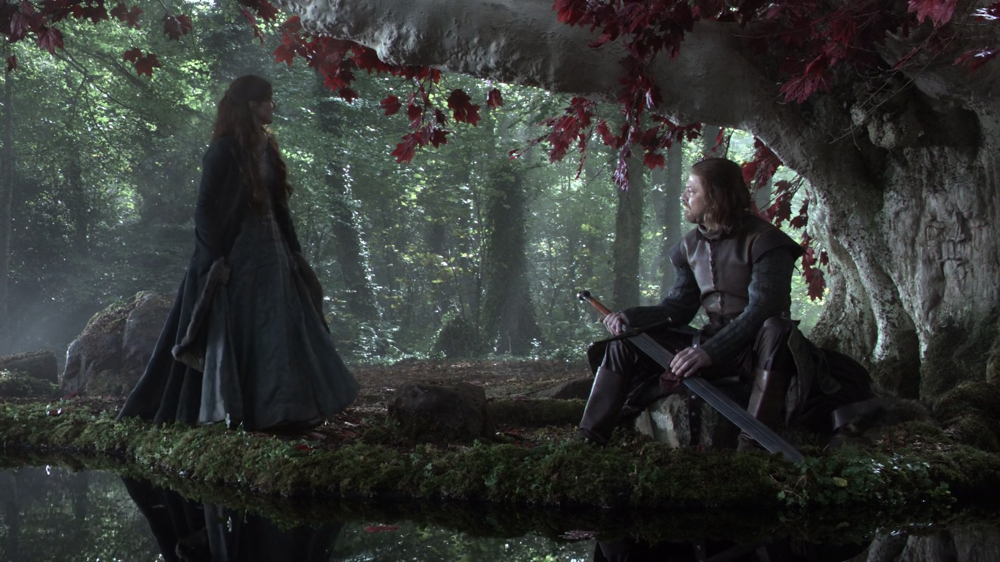

In [6]:
img_ref = get_frame(video_length//2)
cv2_imshow(img_ref[:, :, ::-1])

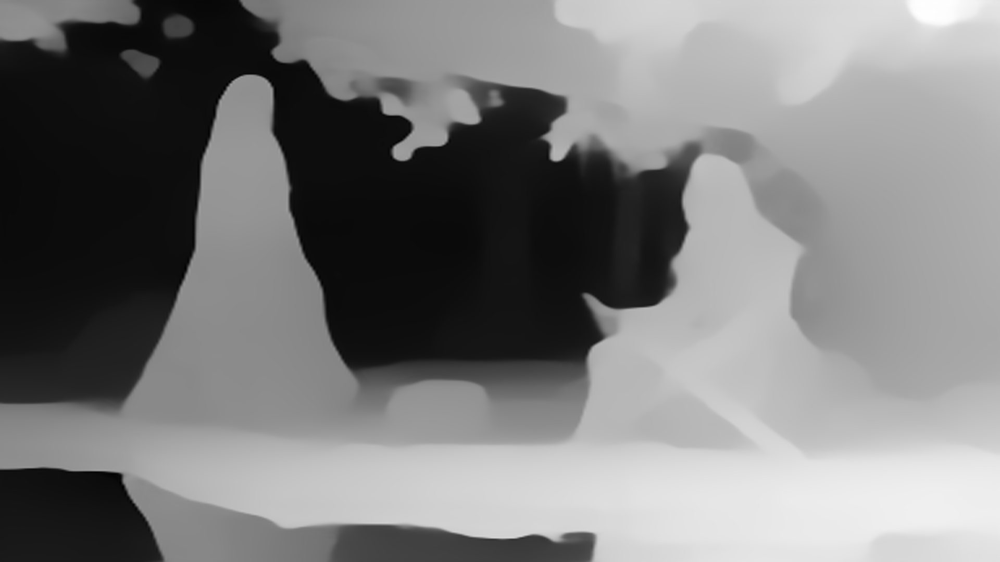

In [7]:
depth_map_ref = compute_depth(img_ref)
cv2_imshow(255*(depth_map_ref-np.min(depth_map_ref))/(np.max(depth_map_ref) - np.min(depth_map_ref)))

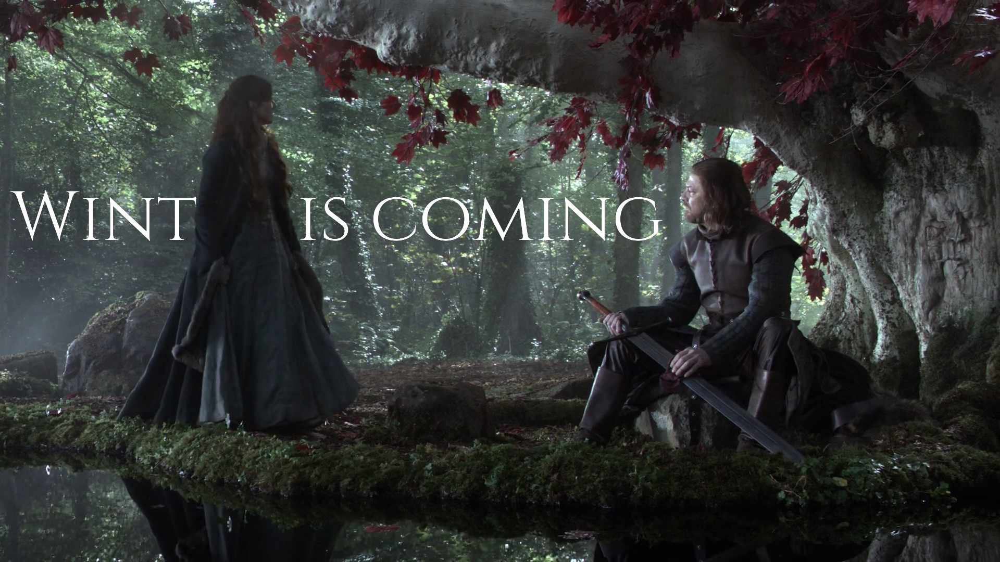

In [8]:
# point_ref: position of the top-left corner of the text
# alpha: transparency of the text
# depth: relative depth for the text (0 = foreground, 1 = background)
# font: font of the text
# font_size: font size of the text
# affine_partial: whether to estimate a partial or full affine matrix (resp. 4 or 5 parameters)

if filename_video == "bowling.mp4":
  caption = "The Big Lebowski"
  point_ref = np.array([[195], [630], [1]])
  alpha = 0.8
  depth = 0.6
  font = "Display - Lobster.ttf"
  font_size = 0.1
  affine_partial = True
else:
  caption = "Winter is coming"
  point_ref = np.array([[20], [750], [1]])
  alpha = 1.0
  depth = 0.65
  font = "Serif - Cinzel.ttf"
  font_size = 0.07
  affine_partial = False

text = get_text_image(img_ref.shape, caption, point_ref[0], point_ref[1], font, font_size=font_size, alpha=alpha)
output = add_text(img_ref, text, matrix=None, depth_map=depth_map_ref, depth=depth)
cv2_imshow(output[:, :, ::-1])

# Aligning two frames

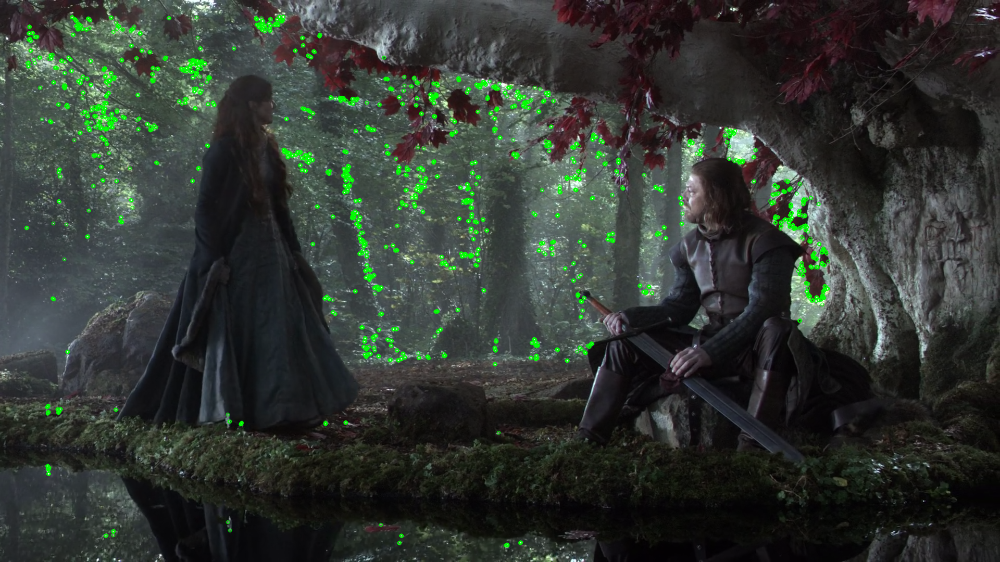

In [9]:
kp_ref, des_ref = get_keypoints_descriptors(img_ref, depth_map=depth_map_ref)
img_with_kp = cv2.drawKeypoints(img_ref, kp_ref, None, color=(0,255,0), flags=0)
cv2_imshow(img_with_kp[:, :, ::-1])

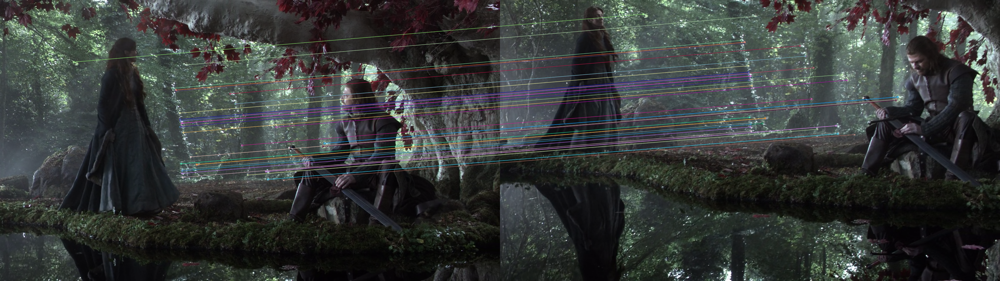

In [10]:
i = video_length//4
img = get_frame(i)
depth_map = compute_depth(img)
kp, des = get_keypoints_descriptors(img, depth_map=depth_map)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des_ref, des)
matches = sorted(matches, key = lambda x: x.distance)
pairs = cv2.drawMatches(img_ref, kp_ref, img, kp, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(pairs[:, :, ::-1])

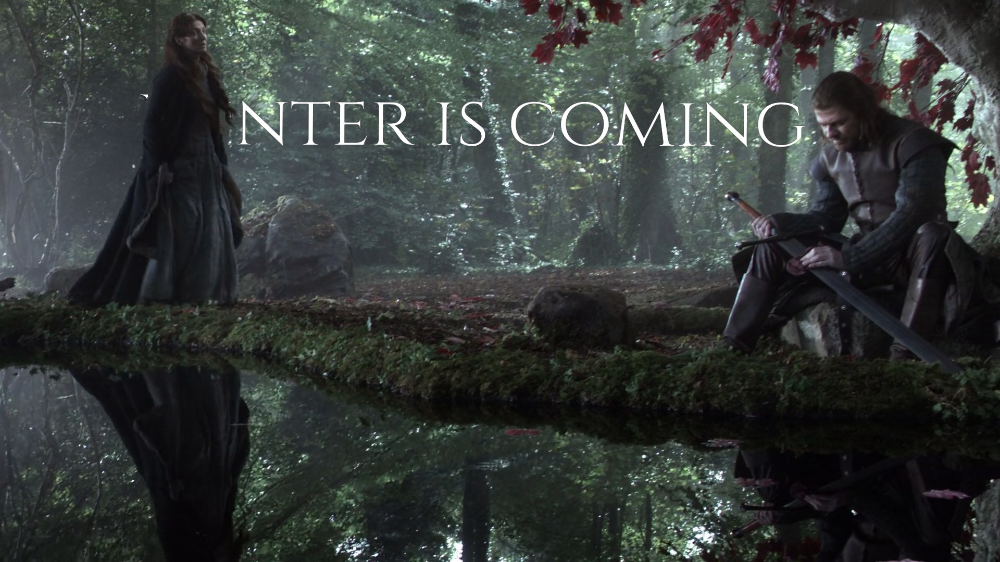

In [11]:
matrix, inliers = get_matrix(img, depth_map, des_ref)
output = add_text(img, text, matrix=matrix, depth_map=depth_map, depth=depth)
cv2_imshow(output[:, :, ::-1])

# Adding text to a video

In [12]:
depth_maps = np.empty((video_length, *img_ref.shape[:2]), dtype=np.float32)
matrices = np.empty((video_length, 2, 3), dtype=np.float32)
nb_matches, nb_inliers = [], []

cap = cv2.VideoCapture(filename_video)
for i in tqdm(range(video_length)):
    ret, img = cap.read()
    if not ret:
      break
    img = img[:, :, ::-1]
    depth_maps[i] = np.expand_dims(compute_depth(img), axis=0)
    matrices[i], inliers = get_matrix(img, depth_map, des_ref, affine_partial=affine_partial)
    nb_matches.append(len(inliers))
    nb_inliers.append(np.sum(inliers))
cap.release()

  0%|          | 0/408 [00:00<?, ?it/s]

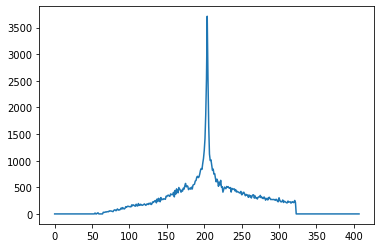

In [13]:
_ = plt.plot(nb_inliers)

In [14]:
# Determination of the frames on which the text should appear
states, sequences = [], []
t, tol = 100, 0.5
state = "no match"
start, end = 0, None
for i in range(video_length):
  if ((nb_inliers[i] < t and state == "no match")
      or (nb_inliers[i] >= t*tol and state == "match")):
    end = i
  elif nb_inliers[i] < t*tol:
    sequences.append((state, start, end))
    state, start, end = "no match", i, i
  elif nb_inliers[i] >= t:
    if end is not None:
      sequences.append((state, start, end))
    state, start, end = "match", i, i
  states.append(state)
sequences.append((state, start, end))
sequences

[('no match', 0, 88), ('match', 89, 322), ('no match', 323, 407)]

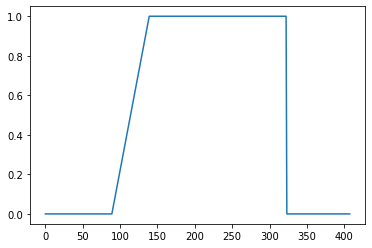

In [15]:
warmup = 50
no_match_yet = True
masks = np.zeros_like(nb_inliers, dtype=np.float32)
matrices2 = np.zeros_like(matrices)
for seq in sequences:
  if seq[0] == "match":
    masks[seq[1]:seq[2] + 1] = 1.0
    if no_match_yet:
      end = min(seq[1] + warmup, seq[2] + 1)
      masks[seq[1]:end] = np.array([i/(end-seq[1]) for i in range(end-seq[1])])
    no_match_yet = False
_ = plt.plot(masks)

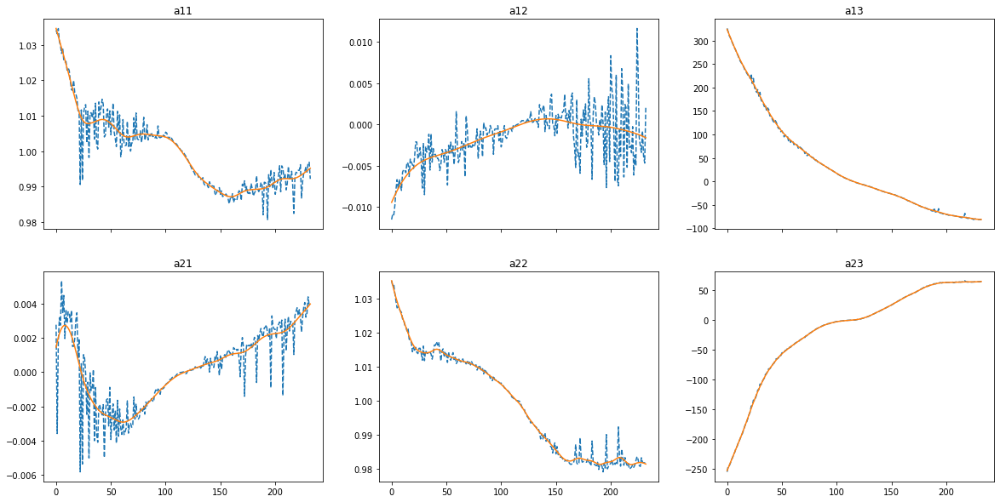

In [16]:
matrices2 = np.zeros_like(matrices)

for seq in sequences:
  if seq[0] == "match":
    if seq[2] - seq[1] < 20:
      matrices2[seq[1]:seq[2] + 1, :, :] = matrices[seq[1]:seq[2] + 1, :, :]
    else:
      for row in range(matrices.shape[1]):
        for column in range(matrices.shape[2]):
          matrices2[seq[1]:seq[2] + 1, row, column] = smoothen(matrices[seq[1]:seq[2] + 1, row, column])

f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex=True, figsize=(20, 10))

for seq in sequences:
  if seq[0] == "match":
    break

ax1.plot(matrices[seq[1]:seq[2], 0, 0], "--")
ax1.plot(matrices2[seq[1]:seq[2], 0, 0])
_ = ax1.set_title("a11")
ax2.plot(matrices[seq[1]:seq[2], 0, 1], "--")
ax2.plot(matrices2[seq[1]:seq[2], 0, 1])
_ = ax2.set_title("a12")
ax3.plot(matrices[seq[1]:seq[2], 0, 2], "--")
ax3.plot(matrices2[seq[1]:seq[2], 0, 2])
_ = ax3.set_title("a13")
ax4.plot(matrices[seq[1]:seq[2], 1, 0], "--")
ax4.plot(matrices2[seq[1]:seq[2], 1, 0])
_ = ax4.set_title("a21")
ax5.plot(matrices[seq[1]:seq[2], 1, 1], "--")
ax5.plot(matrices2[seq[1]:seq[2], 1, 1])
_ = ax5.set_title("a22")
ax6.plot(matrices[seq[1]:seq[2], 1, 2], "--")
_ = ax6.plot(matrices2[seq[1]:seq[2], 1, 2])
_ = ax6.set_title("a23")

In [17]:
video_output = np.empty((video_length, *img_ref.shape), dtype=np.uint8)
cap = cv2.VideoCapture(filename_video)
for i in tqdm(range(video_length)):
  ret, img = cap.read()
  if masks[i] == 0.:
    video_output[i] = np.expand_dims(img, axis=0)
  else:
    captioned = add_text(
        img,
        text,
        matrix=matrices2[i, :, :],
        depth_map=depth_maps[i, :, :],
        depth=depth,
        alpha=masks[i]
    )
    video_output[i] = np.expand_dims(captioned.astype(np.uint8), axis=0)
cap.release()

_, height, width, _ = video_output.shape
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output.mp4', fourcc, fps, (width, height))

for i in range(video_output.shape[0]):
    out.write(video_output[i, :, :, :])

out.release()

  0%|          | 0/408 [00:00<?, ?it/s]

In [18]:
%%capture
!ffmpeg -y -i {filename_video} -f mp3 -vn -async 1 sound.mp3
!ffmpeg -y -i output.mp4 -i sound.mp3 -c copy -map 0:v:0 -map 1:a:0 output2.mp4

# The name of the output video is output2.mp4